# To do list for CBL GBL Processing Guide
 
 - [ ] Update this page for the latest version of the script.

In [37]:
# !python calc_pt_cloud_normal.py

In [38]:
# !python calc_curvature_roughness.py

In [39]:
import pandas as pd
import numpy as np
from hdr_adjustments import contrast_enhancement
import matplotlib.pyplot as plt
from skimage import io
from matplotlib.colors import ListedColormap, BoundaryNorm
from preprocess_point_cloud import map_angle_to_pixel
from typing import Union, List, Dict, Any
from pathlib import Path
from plot_tools import smart_image_pie_chart, get_image_histogram, display_unwrapped_single_band_images, display_unwrapped_rgb_image, display_single_band_img_wt_discrete_values
from norm_to_hsv import attach_normal_color_to_df

# Convert the bin file to a pcd file.

In [40]:
# Ignore warnings
pd.options.mode.chained_assignment = None  # Disable the warning

## Initialize Input Paths

In [41]:
# In zmachine (linux)

# # Harvard Forest
# key_str = "33_03"
# key_str2 = "harvard_forest_33"

# Mangrove Roots
key_str = "UMBCBL009_2024-03-28-02-24-40_ALRSET24_060180_000503.800_647619236"
key_str2 = "ALRSET2"

output_dir = Path(fr'/home/fzhcis/mylab/gdrive/projects_with_Jan/point_cloud_segmentation/unwrap_outputs/{key_str2}/{key_str}/outputs')
filename = output_dir / f'{key_str}_filtered_normaled_curvature_0.06_roughness_0.06.txt'
# saveflag = False
saveflag = True
key_str = key_str.split('_')[0] + '_' + key_str.split('_')[-1]



In [42]:
CANVAS_WIDTH = 1440 
CANVAS_HEIGHT = 540

## Preprocess the Point Cloud data
- read the data as a pandas dataframe
- Clean it
  - Filter with first return and non-extreme intensity values
- prepare x_pix and y_pix columns for grouping

## Prepare the functions for displaying images.

### Observe the density map and histograms

In [43]:
def load_and_preprocess_point_cloud(filename: Union[str, Path]) -> pd.DataFrame:
    """
    Load the point cloud data and preprocess it by:
    1. Attach the pixel values for azimuth and elevation
    2. Attach the HSV color values for the normal
    3. Reverse the range values and z values

    Args:
        filename: str or Path: The path to the point cloud data

    Returns:
        pd.DataFrame: The preprocessed point cloud data
    """

    df_filtered = pd.read_csv(filename, sep=',')
    azimuth, elevation = df_filtered['azimuth'], df_filtered['elevation']
    x_pix, y_pix = map_angle_to_pixel(azimuth, elevation)
    df_filtered['x_pix'] = x_pix
    df_filtered['y_pix'] = y_pix

    # Grab HSV color from the normal and attach the color to the dataframe
    df_filtered_ncolored = attach_normal_color_to_df(df_filtered)

    # reverse the range values and z values
    # df_filtered_ncolored['rangemeter'] = df_filtered_ncolored['rangemeter'].max() - df_filtered_ncolored['rangemeter']  

    # shift the z values to start from 0
    z_min = df_filtered_ncolored['Z'].min()
    df_filtered_ncolored['Z'] = - (df_filtered_ncolored['Z'] - z_min)
    print("Z shifted to start from 0.")
    # norm_z_max = df_filtered_ncolored['Z'].max()
    # df_filtered_ncolored['Z'] = df_filtered_ncolored['Z'] / norm_z_max
    # print("Z normalized to (0, 1).")
    # # Normalize rangemeter and Z value to (0.1, 1.0)
    for col_name in ['Intensity', 'rangemeter', 'Z', 'curvature', 'roughness']:
        df_filtered_ncolored[col_name] = 0.1 + 0.9 * (df_filtered_ncolored[col_name] - df_filtered_ncolored[col_name].min()) / (df_filtered_ncolored[col_name].max() - df_filtered_ncolored[col_name].min())
        print(f"{col_name} normalized to (0.1, 1.0).")

    
    # Check if there are NaN values or negative values in the columns of interest
    for col_name in ['Intensity', 'azimuth', 'zenith', 'rangemeter']:
            assert df_filtered_ncolored[col_name].isnull().sum() == 0, f"Column {col_name} has NaN values"
            assert (df_filtered_ncolored[col_name] < 0).sum() == 0, f"Column {col_name} has negative values"

    return df_filtered_ncolored

In [44]:
def unwrap_point_cloud_to_2d_images(filename: str) -> tuple[pd.DataFrame, tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]]:
    """
    Unwrap the point cloud to 2D images with x being azimuth angle, y being zenith angle, and pixel value with different kinds of scalar fields.
    Including density, intensity, range, and range-xy images.

    Parameters:
    filename (str): The path to the point cloud data file in CSV format.
    saveflag (bool): If True, save the images to the output_dir directory. Default is True.

    Returns:
    df_filtered (pd.DataFrame): A DataFrame containing the filtered and processed point cloud data with additional columns for pixel coordinates.
    tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]: A tuple containing the density image, adjusted intensity image, adjusted range image, and adjusted range-xy image.
    """
    ## Load and Preprocess the point cloud data
    df_filtered_ncolored = load_and_preprocess_point_cloud(filename)
    grouped = df_filtered_ncolored.groupby(['y_pix', 'x_pix'], observed=False)

    # Compute intensity and range per pixel. 
    # [Since less than 0.1% of the pixels contain more than one point, 
    # it may or may not matter if we use mean or max.]

    # Use mean to avoid too much noise

    group_intensity = grouped['Intensity'].mean()
    group_z = grouped['Z'].min()
    group_range = grouped['rangemeter'].mean()
    pts_per_pixel = grouped.size()
    curvature_per_pixel = grouped['curvature'].mean()
    roughness_per_pixel = grouped['roughness'].mean()
    

    ## Map the computed values to the image arrays
    ## Create empty image canvases with proper resolution
    intensity_image = np.zeros((CANVAS_HEIGHT, CANVAS_WIDTH), dtype=np.float32)
    range_image = np.zeros((CANVAS_HEIGHT, CANVAS_WIDTH), dtype=np.float32)
    z_image = np.zeros((CANVAS_HEIGHT, CANVAS_WIDTH), dtype=np.float32)
    density_image = np.zeros((CANVAS_HEIGHT, CANVAS_WIDTH), dtype=np.float32)
    curvature_image = np.zeros((CANVAS_HEIGHT, CANVAS_WIDTH), dtype=np.float32)
    roughness_image = np.zeros((CANVAS_HEIGHT, CANVAS_WIDTH), dtype=np.float32)
    
    pxpy_indices = np.array(group_intensity.index.tolist())
    intensity_image[pxpy_indices[:, 0], pxpy_indices[:, 1]] = group_intensity.values
    z_image[pxpy_indices[:, 0], pxpy_indices[:, 1]] = group_z.values
    range_image[pxpy_indices[:, 0], pxpy_indices[:, 1]] = group_range.values
    density_image[pxpy_indices[:, 0], pxpy_indices[:, 1]] = pts_per_pixel.values
    curvature_image[pxpy_indices[:, 0], pxpy_indices[:, 1]] = curvature_per_pixel.values
    roughness_image[pxpy_indices[:, 0], pxpy_indices[:, 1]] = roughness_per_pixel.values


    # Step 6: Apply HDR adjustment to intensity and range images
    intensity_image_adjusted = contrast_enhancement(intensity_image, stretch_percentile=0.1)

    # Range and Z Map Inverses should not be adjusted by contrast as they should only be globally adjusted.
    z_image_adjusted = contrast_enhancement(z_image, stretch_percentile=0.1)
    range_image_adjusted = contrast_enhancement(range_image, stretch_percentile=0)
    curvature_image_adjusted = contrast_enhancement(curvature_image)
    roughness_image_adjusted = contrast_enhancement(roughness_image)

    image_names = ['Density Map', 
                    'Intensity Map (adjusted)', 
                    'Z Map Inverse (adjusted)',
                    'Range Map (adjusted)', 
                    'Curvature Map (adjusted)',
                    'Roughness Map (adjusted)',
                    'Intensity Map (raw)', 
                    'Z Map Inverse (raw)',
                    'Range Map (raw)', 
                    'Curvature Map (raw)',
                    'Roughness Map (raw)',
                    ]
    
    

    output_images = (density_image, 
                     intensity_image_adjusted, 
                     z_image_adjusted,
                     range_image_adjusted, 
                     curvature_image_adjusted,
                     roughness_image_adjusted,
                     intensity_image, 
                     z_image,
                     range_image, 
                     curvature_image,
                     roughness_image,
                     )
    
    output_images_dict = {image_name: image for image_name, image in zip(image_names, output_images)}
   
    return df_filtered_ncolored, output_images_dict


In [45]:
def unwrap_pc_normals_to_rgb_image(df_filtered_ncolored: pd.DataFrame) -> np.ndarray:
    """
    Unwrap the point cloud to 2D images with x being azimuth angle, y being zenith angle, and pixel values
    colorized by the normal vectors.

    Parameters:
    
    """
    grouped = df_filtered_ncolored.groupby(['y_pix', 'x_pix'], observed=False)

    r_per_pixel = grouped['n_r'].mean()
    g_per_pixel = grouped['n_g'].mean()
    b_per_pixel = grouped['n_b'].mean()


    ## Map the computed values to the image arrays
    ## Create empty image canvases with proper resolution
    r_image = np.zeros((CANVAS_HEIGHT, CANVAS_WIDTH), dtype=np.float32)
    g_image = np.zeros((CANVAS_HEIGHT, CANVAS_WIDTH), dtype=np.float32)
    b_image = np.zeros((CANVAS_HEIGHT, CANVAS_WIDTH), dtype=np.float32)
    
    pxpy_indices = np.array(r_per_pixel.index.tolist())
    r_image[pxpy_indices[:, 0], pxpy_indices[:, 1]] = r_per_pixel.values
    g_image[pxpy_indices[:, 0], pxpy_indices[:, 1]] = g_per_pixel.values
    b_image[pxpy_indices[:, 0], pxpy_indices[:, 1]] = b_per_pixel.values

    # Stack the single channel images to create an RGB image
    rgb_image = np.stack((r_image, g_image, b_image), axis=-1) # Shape: (540, 1440, 3)
   
    return rgb_image

## Run the above process
- display density map and density histogram
- display Intensity Map, Range Map, and Range-XY Map

Z shifted to start from 0.
Intensity normalized to (0.1, 1.0).
rangemeter normalized to (0.1, 1.0).
Z normalized to (0.1, 1.0).
curvature normalized to (0.1, 1.0).
roughness normalized to (0.1, 1.0).
Stretching image by 0.1 percent. (Void pixels excluded)
Global Histogram Equalization applied. (Void pixels excluded)
Stretching image by 0.1 percent. (Void pixels excluded)
Global Histogram Equalization applied. (Void pixels excluded)
Global Histogram Equalization applied. (Void pixels excluded)
Stretching image by 1 percent. (Void pixels excluded)
Global Histogram Equalization applied. (Void pixels excluded)
Stretching image by 1 percent. (Void pixels excluded)
Global Histogram Equalization applied. (Void pixels excluded)


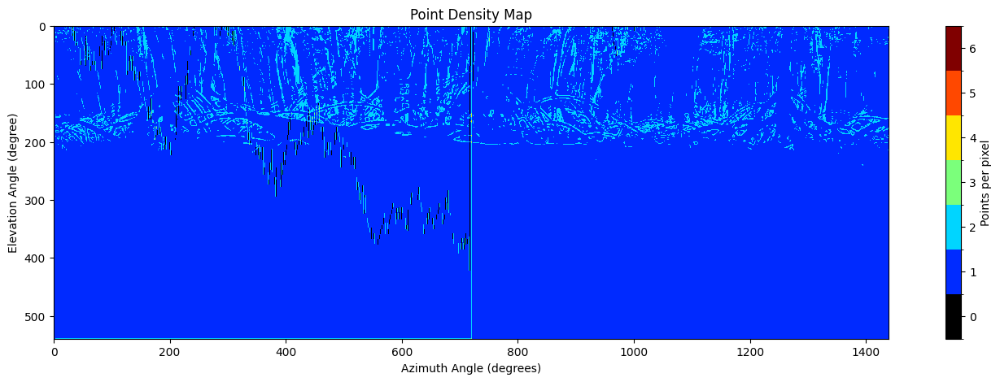

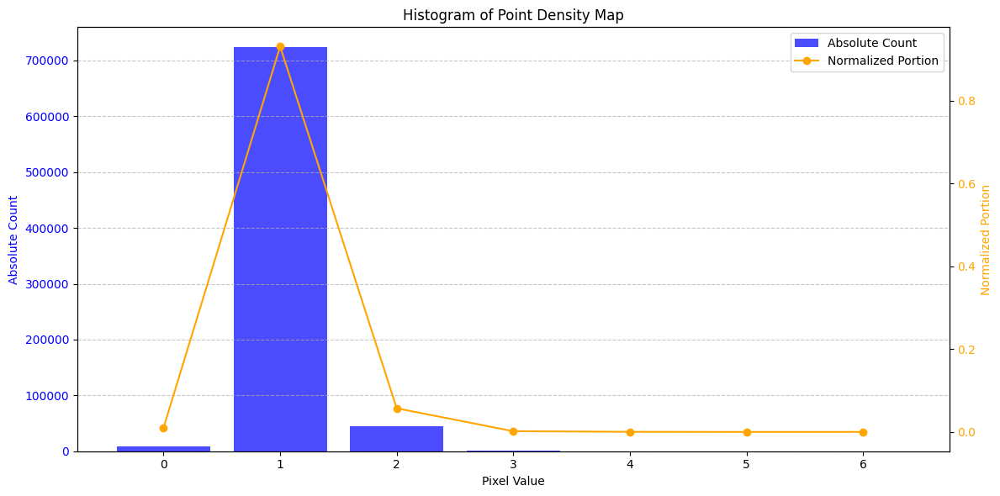

Histogram:
Values: [0. 1. 2. 3. 4. 5. 6.]
Counts: [  8189 723449  44349   1388    199      2     24]
Normalized Counts: [0.011 0.93  0.057 0.002 0.    0.    0.   ]


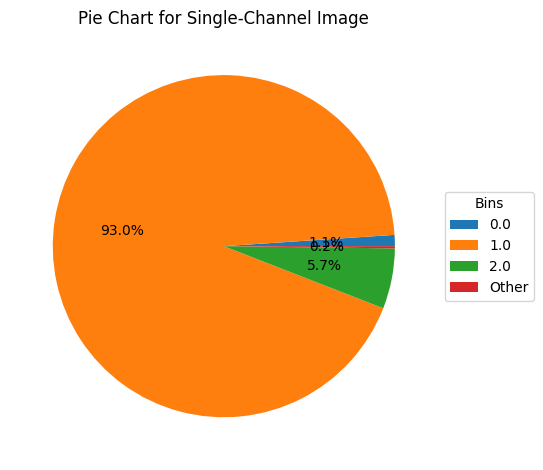

In [46]:
df_filtered, output_images_dict = unwrap_point_cloud_to_2d_images(filename)
density_image = output_images_dict['Density Map']
display_single_band_img_wt_discrete_values(density_image, title='Point Density Map', output_dir=output_dir, saveflag=False)



Displaying Intensity Map (adjusted) image...
Displaying Z Map Inverse (adjusted) image...
Displaying Range Map (adjusted) image...
Displaying Curvature Map (adjusted) image...
Displaying Roughness Map (adjusted) image...
Displaying Intensity Map (raw) image...
Displaying Z Map Inverse (raw) image...
Displaying Range Map (raw) image...
Displaying Curvature Map (raw) image...
Displaying Roughness Map (raw) image...


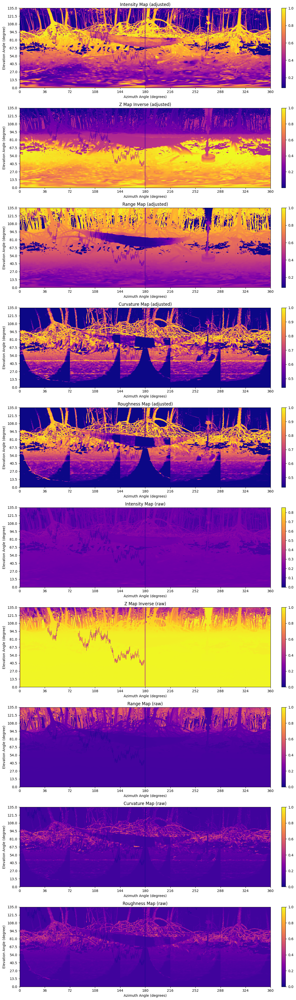

Images saved to /home/fzhcis/mylab/gdrive/projects_with_Jan/point_cloud_segmentation/unwrap_outputs/ALRSET2/UMBCBL009_2024-03-28-02-24-40_ALRSET24_060180_000503.800_647619236/outputs directory


In [47]:

# Step 7: Display and save the adjusted intensity and range images
titles = ['Intensity Map (adjusted)', 
        'Z Map Inverse (adjusted)',
        'Range Map (adjusted)', 
        'Curvature Map (adjusted)',
        'Roughness Map (adjusted)',
        'Intensity Map (raw)', 
        'Z Map Inverse (raw)',
        'Range Map (raw)', 
        'Curvature Map (raw)',
        'Roughness Map (raw)',
        ]
display_images = [output_images_dict[title] for title in titles]
display_unwrapped_single_band_images(display_images, 
                                    titles=titles,
                                    key_str=key_str,
                                    output_dir=output_dir,
                                    saveflag=saveflag)



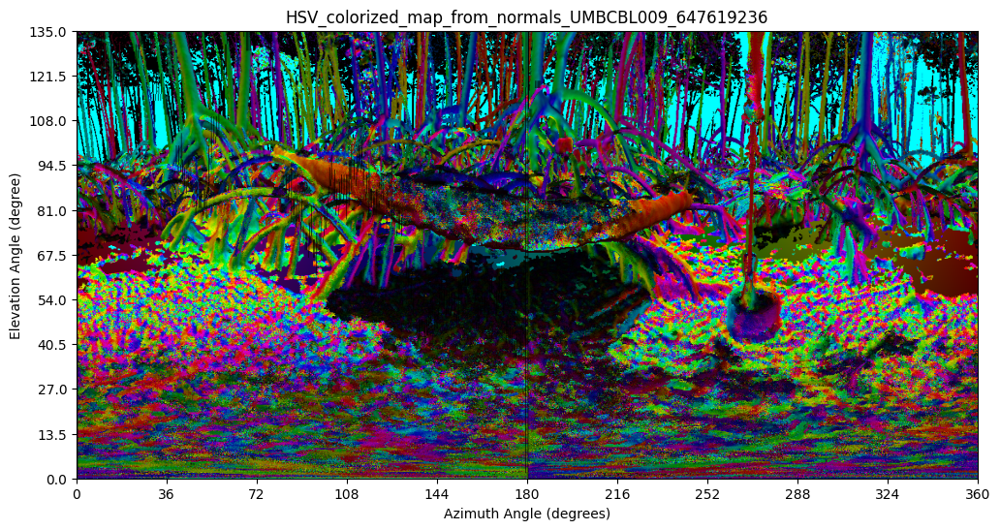

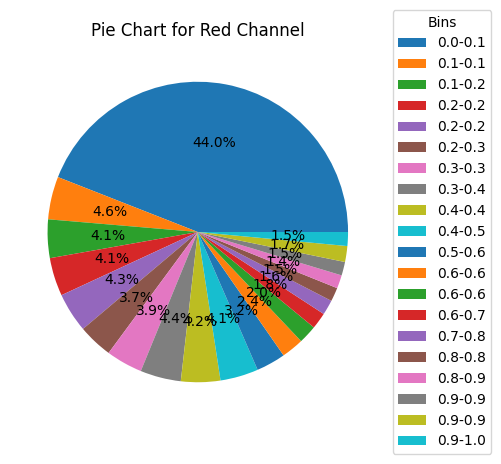

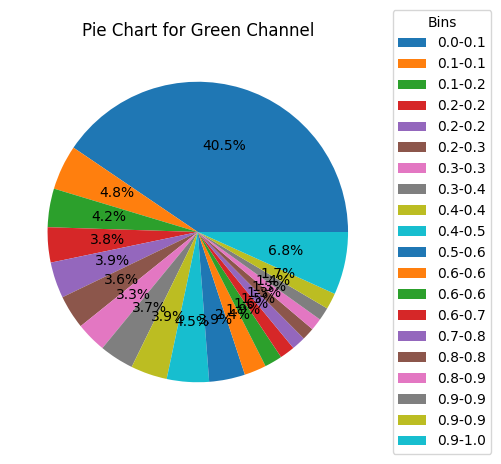

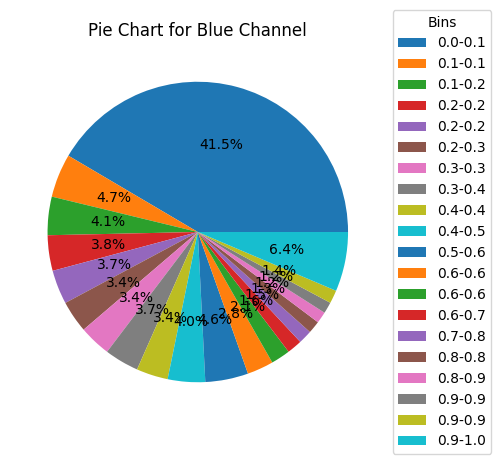

In [48]:
# Display the normals colorized RGB image.
normals_rgb_image = unwrap_pc_normals_to_rgb_image(df_filtered)
display_unwrapped_rgb_image(normals_rgb_image, 
                            figure_title=f'HSV_colorized_map_from_normals_{key_str}', 
                            saveflag=saveflag, 
                            output_dir=output_dir)

In [49]:
# for hist_image, title in zip(output_images, titles):
#     get_image_histogram(image_data=hist_image, title=title, saveflag=False, output_dir=output_dir)

## Combine Unwrapped images to an psudo-RGB image

In [50]:
def save_image_cube_and_metadata(
    output_images_dict: Dict[str, np.ndarray],
    normals_rgb_image: np.ndarray,
    output_dir: Path,
    key_str: str,
    key_str2: str
) -> tuple[np.ndarray, Dict[str, Any]]:
    """
    Saves an image cube and its metadata.

    This function constructs an image cube by stacking different adjusted maps
    (Intensity, Z, Range, Curvature, Roughness) along with the normal vector RGB
    image and then saves it as a `.npy` file. Additionally, metadata related to
    the image processing steps and other relevant information is saved in a separate
    `.npy` file.

    Parameters:
    - output_images_dict: A dictionary mapping titles of processed maps to numpy arrays.
    - normals_rgb_image: A numpy array representing the RGB image of normal vectors.
    - output_dir: The directory where the output files will be saved.
    - key_str: A string to be included in the filenames for the saved files.
    - key_str2: Another string that will be included in the metadata.

    Returns:
    - None
    """

    # Titles for the image channels
    save_titles = [
        'Intensity Map (adjusted)',
        'Z Map Inverse (adjusted)',
        'Range Map (adjusted)', 
        'Curvature Map (adjusted)',
        'Roughness Map (adjusted)'
    ]

    # Dynamically fetch the adjusted maps
    adjusted_maps = []
    for title in save_titles:
        try:
            adjusted_map = output_images_dict[title]
            # Examine the shape of the adjusted map
            if adjusted_map.shape != normals_rgb_image.shape[:2]:
                raise ValueError(f"Shape mismatch: {title} shape: {adjusted_map.shape}, normals_rgb_image shape: {normals_rgb_image.shape[:2]}")
            adjusted_maps.append(output_images_dict[title])
        except KeyError as e:
            print(f"Missing key: {e}")
            raise KeyError(f"Key {e} not found in the output_images_dict.")

    image_cube = np.stack(adjusted_maps, axis=-1)
    image_cube = np.concatenate([image_cube, normals_rgb_image], axis=-1)

    # Save the image cube
    image_cube_path = output_dir / f'{key_str}_image_cube.npy'
    np.save(image_cube_path, image_cube)
    print(f"Image cube saved to {image_cube_path}, shape: {image_cube.shape}")

    # Prepare metadata dynamically
    preprocess_metadata = {}
    for title in save_titles:
        preprocess_metadata[title] = f"Contrast enhanced {title.lower()}; first normalized all the values to (0.1, 1.0), then did histogram equalization on the valid pixels."

    # Include the metadata for the normals RGB map
    preprocess_metadata['Normals RGB - Cnx, Cny, Cnz'] = 'RGB image colorized by the normal vectors.'

    # Metadata for the image cube
    metadata = {
        'titles': save_titles + ['Normals RGB - Cnx, Cny, Cnz'],
        'shape': image_cube.shape,
        'dtype': image_cube.dtype,
        'key_str': key_str,
        'key_str2': key_str2,
        'output_dir': output_dir,
        'preprocess_metadata': preprocess_metadata
    }

    # Save the metadata
    metadata_path = output_dir / f'{key_str}_image_cube_metadata.npy'
    np.save(metadata_path, metadata)
    print(f"Metadata saved to {metadata_path}")
    print(f"Metadata titles:\n{metadata['titles']}")

    return image_cube, metadata


save_image_cube_and_metadata(
    output_images_dict, 
    normals_rgb_image, 
    output_dir, 
    key_str, 
    key_str2
)

Image cube saved to /home/fzhcis/mylab/gdrive/projects_with_Jan/point_cloud_segmentation/unwrap_outputs/ALRSET2/UMBCBL009_2024-03-28-02-24-40_ALRSET24_060180_000503.800_647619236/outputs/UMBCBL009_647619236_image_cube.npy, shape: (540, 1440, 8)
Metadata saved to /home/fzhcis/mylab/gdrive/projects_with_Jan/point_cloud_segmentation/unwrap_outputs/ALRSET2/UMBCBL009_2024-03-28-02-24-40_ALRSET24_060180_000503.800_647619236/outputs/UMBCBL009_647619236_image_cube_metadata.npy
Metadata titles:
['Intensity Map (adjusted)', 'Z Map Inverse (adjusted)', 'Range Map (adjusted)', 'Curvature Map (adjusted)', 'Roughness Map (adjusted)', 'Normals RGB - Cnx, Cny, Cnz']


(array([[[1.49766356e-01, 1.24175195e-02, 9.62411225e-01, ...,
          2.49953538e-01, 5.50298195e-04, 0.00000000e+00],
         [8.36938918e-02, 1.14503177e-03, 8.36549029e-02, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [8.05765510e-01, 6.00501709e-02, 9.03192103e-01, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [1.05133921e-01, 1.24027599e-02, 9.62541997e-01, ...,
          2.46958911e-01, 2.94660707e-03, 0.00000000e+00],
         [1.48231715e-01, 1.25701521e-02, 9.62319672e-01, ...,
          2.50358462e-01, 1.15164579e-03, 0.00000000e+00],
         [1.55096188e-01, 1.22981798e-02, 9.62679267e-01, ...,
          2.49953538e-01, 5.50298195e-04, 0.00000000e+00]],
 
        [[1.70299664e-01, 1.28233964e-02, 9.62570310e-01, ...,
          2.48532146e-01, 5.73228928e-04, 0.00000000e+00],
         [8.36938918e-02, 1.14503177e-03, 8.36549029e-02, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       

In [51]:
def load_image_cube_and_metadata(image_cube_path: Path, metadata_path: Path) -> Dict[str, Any]:
    """
    Loads an image cube and its metadata from saved .npy files.

    Parameters:
    - image_cube_path: The path to the saved image cube file.
    - metadata_path: The path to the saved metadata file.

    Returns:
    - A dictionary containing the image cube and metadata.

    # # Example usage of the load_image_cube_and_metadata function
    # # Define file paths
    # image_cube_path = output_dir / f'{key_str}_image_cube.npy'
    # metadata_path = output_dir / f'{key_str}_image_cube_metadata.npy'

    # # Load the image cube and metadata
    # data = load_image_cube_and_metadata(image_cube_path, metadata_path)

    # # Access the image cube and metadata separately
    # image_cube = data['image_cube']
    # metadata = data['metadata']

    # # Example: print out the shape of the image cube and titles from the metadata
    # print(f"Image Cube Shape: {image_cube.shape}")
    # print("Metadata Titles: ", metadata['titles'])
    """
    
    # Load the image cube (8-channel data)
    image_cube = np.load(image_cube_path)
    print(f"Image cube loaded from {image_cube_path}, shape: {image_cube.shape}")
    
    # Load the metadata
    metadata = np.load(metadata_path, allow_pickle=True).item()  # use .item() to load it as a dictionary
    print(f"Metadata loaded from {metadata_path}")

    return {
        'image_cube': image_cube,
        'metadata': metadata
    }




In [ ]:
def normalize_and_stack_images(image_list: List[np.array], method="global"):
    """
    Normalize a list of image channels either globally after stacking or per-channel before stacking.

    Parameters:
        image_list (list of np.ndarray): List of 2D arrays representing image channels (e.g., intensity, range).
        method (str): Normalization method, either "global" for global normalization after stacking
                      or "per_channel" for per-channel normalization before stacking.
                      

    Returns:
        np.ndarray: Normalized and stacked 3D array with shape (H, W, C).
    """
    if method not in ["global", "per_channel"]:
        raise ValueError("Invalid method. Choose 'global' or 'per_channel'.")

    if method == "per_channel":
        # Normalize each channel independently
        for i in range(len(image_list)):
            img_mean = image_list[i].mean()
            img_std = image_list[i].std()
            img_norm = (image_list[i] - img_mean) / (img_std + 1e-8)  # Avoid division by zero
            img_min = img_norm.min()
            img_max = img_norm.max()
            image_list[i] = (img_norm - img_min) / (img_max - img_min)

        # Stack the normalized channels
        stacked_image = np.stack(image_list, axis=-1)

    elif method == "global":
        # Normalize each channel first (zero mean, unit variance)
        for i in range(len(image_list)):
            img_mean = image_list[i].mean()
            img_std = image_list[i].std()
            image_list[i] = (image_list[i] - img_mean) / (img_std + 1e-8)

        # Stack the channels
        stacked_image = np.stack(image_list, axis=-1)

        # Perform global rescaling to (0, 1)
        stack_min = stacked_image.min()
        stack_max = stacked_image.max()
        stacked_image = (stacked_image - stack_min) / (stack_max - stack_min + 1e-8)

    return stacked_image

In [53]:
def create_pseudo_rgb_image(intensity_image: np.ndarray, 
                            range_image: np.ndarray, 
                            third_channel_img: np.ndarray, 
                            figure_title: str = '',
                            saveflag:bool=False) -> np.ndarray:
    """
    Combine intensity, range, and density images into a pseudo-RGB image.

    Parameters:
    -----------
    intensity_image : np.ndarray
        The adjusted intensity image.
    range_image : np.ndarray
        The adjusted range image.
    third_channel_img : np.ndarray
        The third channel image, can be roughness or curvature.

    Returns:
    --------
    np.ndarray
        The pseudo-RGB image.
    """
    # Normalize each channel before stacking them
    image_list = [intensity_image, range_image, third_channel_img]
    pseudo_rgb_image = normalize_and_stack_images(image_list, method="global")
    display_unwrapped_rgb_image(pseudo_rgb_image, 
                            figure_title, 
                            output_dir, 
                            saveflag
                            )

    return pseudo_rgb_image



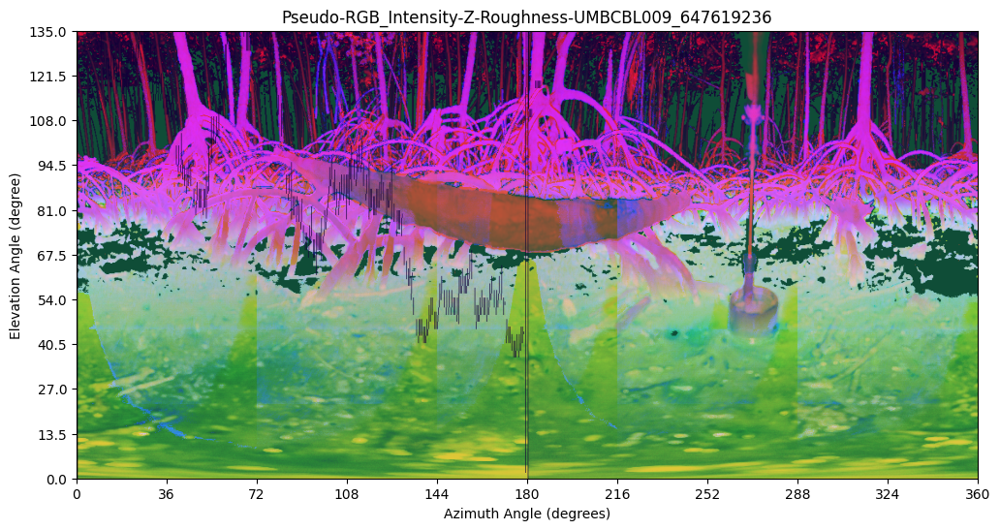

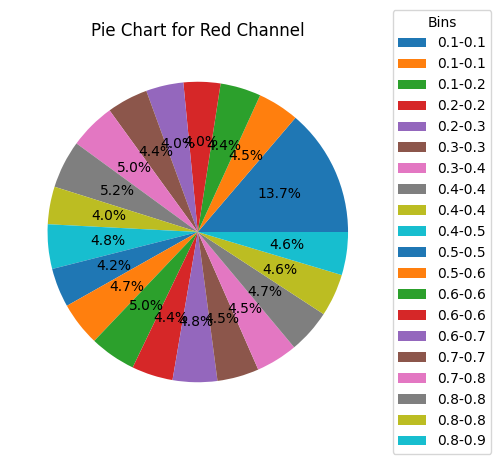

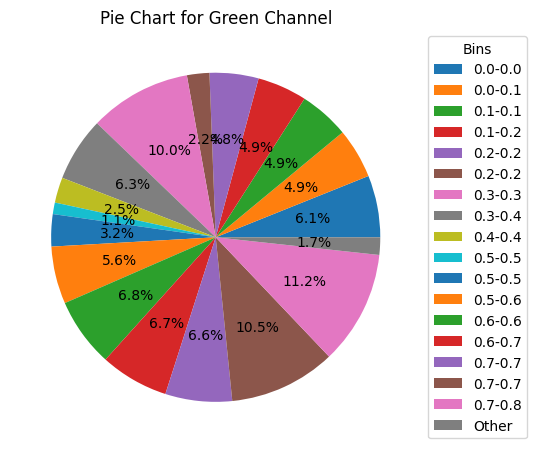

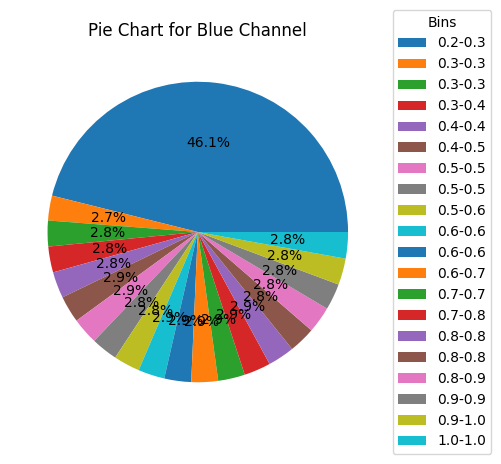

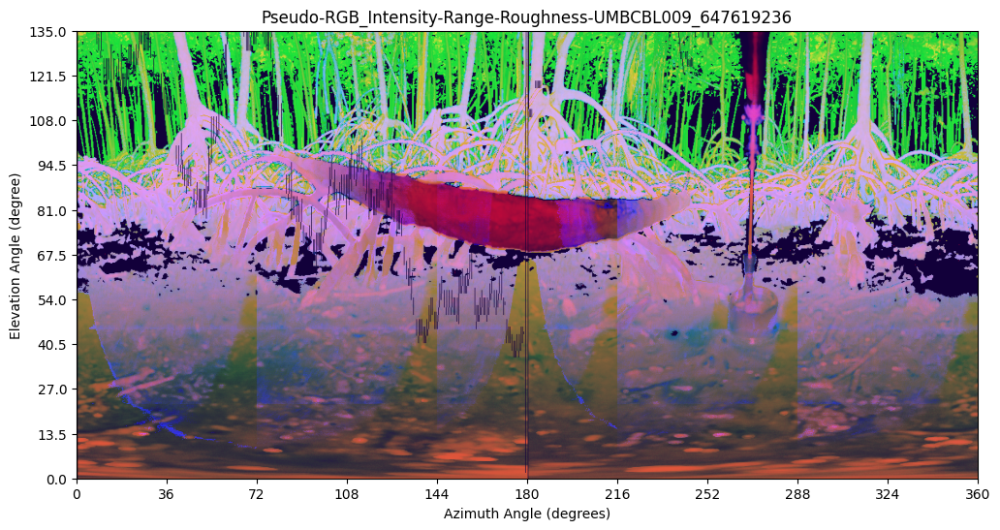

...

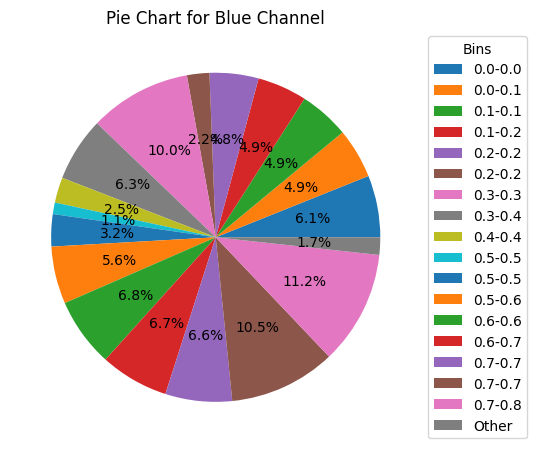

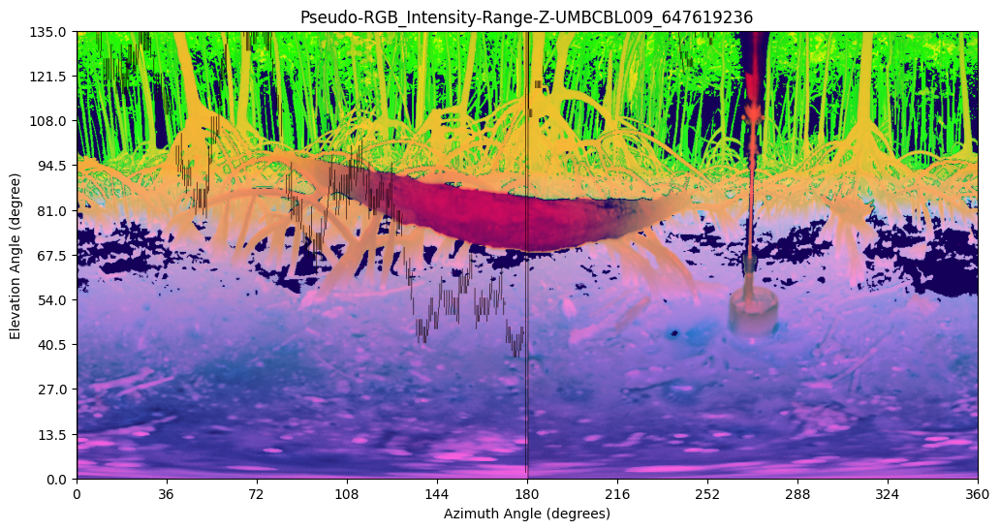

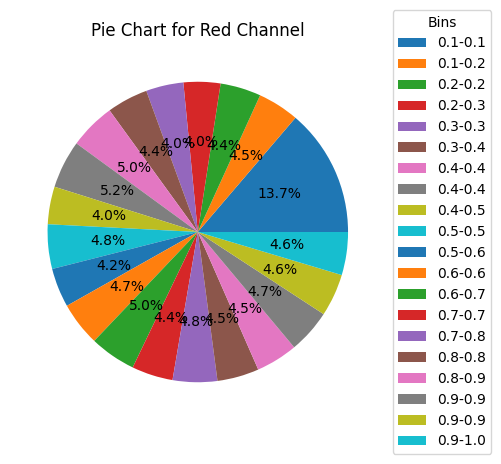

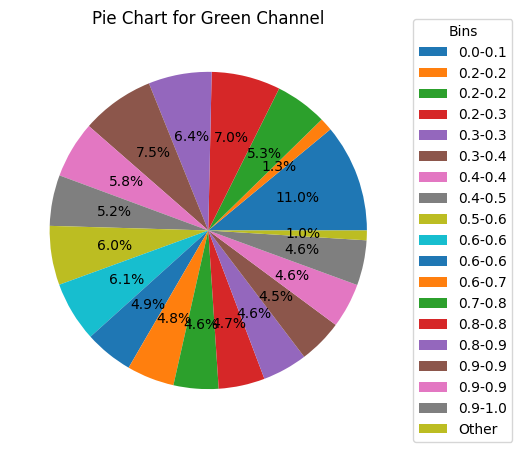

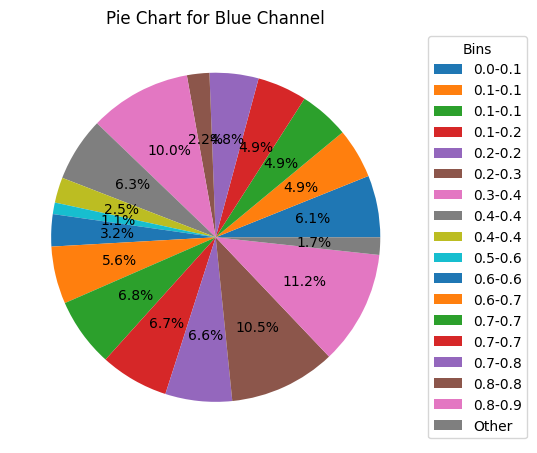

In [54]:

# Create the pseudo-RGB image
figure_title_1 = f'Pseudo-RGB_Intensity-Z-Roughness-{key_str}'
figure_title_2 = f'Pseudo-RGB_Intensity-Range-Roughness-{key_str}'
figure_title_3 = f'Pseudo-RGB_Z-Roughness-Intensity-{key_str}'
figure_title_4 = f'Pseudo-RGB_Roughness-Intensity-Z-{key_str}'
figure_title_5 = f'Pseudo-RGB_Intensity-Range-Z-{key_str}'

intensity_image_adjusted = output_images_dict['Intensity Map (adjusted)']
z_image_adjusted = output_images_dict['Z Map Inverse (adjusted)']
range_image_adjusted = output_images_dict['Range Map (adjusted)']
curvature_image_adjusted = output_images_dict['Curvature Map (adjusted)']
roughness_image_adjusted = output_images_dict['Roughness Map (adjusted)']
pseudo_rgb_image_1 = create_pseudo_rgb_image(intensity_image_adjusted, z_image_adjusted, roughness_image_adjusted, figure_title_1, saveflag=saveflag)
pseudo_rgb_image_2 = create_pseudo_rgb_image(intensity_image_adjusted, range_image_adjusted, roughness_image_adjusted, figure_title_2, saveflag=saveflag)
pseudo_rgb_image_3 = create_pseudo_rgb_image(z_image_adjusted, roughness_image_adjusted, intensity_image_adjusted, figure_title_3, saveflag=saveflag)
pseudo_rgb_image_4 = create_pseudo_rgb_image(roughness_image_adjusted, intensity_image_adjusted, z_image_adjusted, figure_title_4, saveflag=saveflag)
pseudo_rgb_image_5 = create_pseudo_rgb_image(intensity_image_adjusted, range_image_adjusted, z_image_adjusted, figure_title_5, saveflag=saveflag)

